# Clean trajectory
This notebook presents a general cleaning process to clean a moving pandas trajectory loaded from gpx file

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import gpxpy
import gpxpy.gpx
from fiona.crs import from_epsg
from keplergl import KeplerGl
import geopandas as gpd
import movingpandas as mpd
import uuid
import hvplot.pandas
from pyproj import CRS


In [2]:

# Injected parameters
from dagster import seven as __dm_seven
import dagstermill as __dm_dagstermill
context = __dm_dagstermill._reconstitute_job_context(
    **{
        key: __dm_seven.json.loads(value)
        for key, value
        in {'executable_dict': '{"__class__": "ReconstructablePipeline", "asset_selection": {"__frozenset__": [{"__class__": "AssetKey", "path": ["MG91_20230428_persona", "trajectory_clean", "MG91_persona_reloj_20230428_02_traj_clean_jupyter"]}]}, "pipeline_name": "__ASSET_JOB", "repository": {"__class__": "ReconstructableRepository", "container_context": null, "container_image": null, "entry_point": ["dagster"], "executable_path": "/home/jag/anaconda3/envs/llacta-rumbos/bin/python3.10", "pointer": {"__class__": "ModuleCodePointer", "fn_name": "defs", "module": "tutorial_project", "working_directory": "/home/jag/dev/llactalab/rumbos/gps-duck/tutorial-project"}, "repository_load_data": null}, "solid_selection_str": null}', 'job_run_dict': '{"__class__": "PipelineRun", "asset_selection": {"__frozenset__": [{"__class__": "AssetKey", "path": ["MG91_20230428_persona", "trajectory_clean", "MG91_persona_reloj_20230428_02_traj_clean_jupyter"]}]}, "execution_plan_snapshot_id": "9506204e54623e0e1d6ae3647d379c01a025aca4", "external_pipeline_origin": {"__class__": "ExternalPipelineOrigin", "external_repository_origin": {"__class__": "ExternalRepositoryOrigin", "repository_location_origin": {"__class__": "ManagedGrpcPythonEnvRepositoryLocationOrigin", "loadable_target_origin": {"__class__": "LoadableTargetOrigin", "attribute": null, "executable_path": null, "module_name": "tutorial_project", "package_name": null, "python_file": null, "working_directory": "/home/jag/dev/llactalab/rumbos/gps-duck/tutorial-project"}, "location_name": "tutorial_project"}, "repository_name": "__repository__"}, "pipeline_name": "__ASSET_JOB"}, "has_repository_load_data": false, "mode": null, "parent_run_id": null, "pipeline_code_origin": {"__class__": "PipelinePythonOrigin", "pipeline_name": "__ASSET_JOB", "repository_origin": {"__class__": "RepositoryPythonOrigin", "code_pointer": {"__class__": "ModuleCodePointer", "fn_name": "defs", "module": "tutorial_project", "working_directory": "/home/jag/dev/llactalab/rumbos/gps-duck/tutorial-project"}, "container_context": {}, "container_image": null, "entry_point": ["dagster"], "executable_path": "/home/jag/anaconda3/envs/llacta-rumbos/bin/python3.10"}}, "pipeline_name": "__ASSET_JOB", "pipeline_snapshot_id": "a08ed55d5819f1ae9195ff34718fbe778420fb30", "root_run_id": null, "run_config": {}, "run_id": "639ecaa6-4829-4f7f-a598-705b419097cf", "solid_selection": null, "solids_to_execute": null, "status": {"__enum__": "PipelineRunStatus.STARTING"}, "step_keys_to_execute": null, "tags": {".dagster/grpc_info": "{\\"host\\": \\"localhost\\", \\"socket\\": \\"/tmp/tmp6cm0zue7\\"}"}}', 'node_handle_kwargs': '{"name": "MG91_20230428_persona__trajectory_clean__MG91_persona_reloj_20230428_02_traj_clean_jupyter", "parent": null}', 'instance_ref_dict': '{"__class__": "InstanceRef", "compute_logs_data": {"__class__": "ConfigurableClassData", "class_name": "LocalComputeLogManager", "config_yaml": "base_dir: /home/jag/dev/llactalab/rumbos/gps-duck/tutorial-project/output/storage\\n", "module_name": "dagster.core.storage.local_compute_log_manager"}, "custom_instance_class_data": null, "event_storage_data": {"__class__": "ConfigurableClassData", "class_name": "SqliteEventLogStorage", "config_yaml": "base_dir: /home/jag/dev/llactalab/rumbos/gps-duck/tutorial-project/output/history/runs/\\n", "module_name": "dagster.core.storage.event_log"}, "local_artifact_storage_data": {"__class__": "ConfigurableClassData", "class_name": "LocalArtifactStorage", "config_yaml": "base_dir: /home/jag/dev/llactalab/rumbos/gps-duck/tutorial-project/output\\n", "module_name": "dagster.core.storage.root"}, "run_coordinator_data": {"__class__": "ConfigurableClassData", "class_name": "DefaultRunCoordinator", "config_yaml": "{}\\n", "module_name": "dagster.core.run_coordinator"}, "run_launcher_data": {"__class__": "ConfigurableClassData", "class_name": "DefaultRunLauncher", "config_yaml": "{}\\n", "module_name": "dagster"}, "run_storage_data": {"__class__": "ConfigurableClassData", "class_name": "SqliteRunStorage", "config_yaml": "base_dir: /home/jag/dev/llactalab/rumbos/gps-duck/tutorial-project/output/history/\\n", "module_name": "dagster.core.storage.runs"}, "schedule_storage_data": {"__class__": "ConfigurableClassData", "class_name": "SqliteScheduleStorage", "config_yaml": "base_dir: /home/jag/dev/llactalab/rumbos/gps-duck/tutorial-project/output/schedules\\n", "module_name": "dagster.core.storage.schedules"}, "scheduler_data": {"__class__": "ConfigurableClassData", "class_name": "DagsterDaemonScheduler", "config_yaml": "{}\\n", "module_name": "dagster.core.scheduler"}, "secrets_loader_data": null, "settings": {}, "storage_data": {"__class__": "ConfigurableClassData", "class_name": "DagsterSqliteStorage", "config_yaml": "base_dir: /home/jag/dev/llactalab/rumbos/gps-duck/tutorial-project/output\\n", "module_name": "dagster.core.storage.sqlite_storage"}}', 'step_key': '"MG91_20230428_persona__trajectory_clean__MG91_persona_reloj_20230428_02_traj_clean_jupyter"', 'output_log_path': '"/tmp/tmpxw93r97s"', 'marshal_dir': '"/tmp/dagstermill/639ecaa6-4829-4f7f-a598-705b419097cf/marshal"', 'run_config': '{}'}.items()
    }
)
cleaned = __dm_dagstermill._load_input_parameter('cleaned')
smoothed = __dm_dagstermill._load_input_parameter('smoothed')
traj = __dm_dagstermill._load_input_parameter('traj')


   code                        asset_name  \
0  MG91  MG91_artefacto_reloj_20230428_01   
1  MG91  MG91_artefacto_reloj_20230428_02   
2  MG91    MG91_persona_reloj_20230428_01   
3  MG91    MG91_persona_reloj_20230428_02   
4  MG91  MG91_artefacto_reloj_20230503_01   
5  MG91  MG91_artefacto_reloj_20230503_02   
6  MG91    MG91_persona_reloj_20230503_01   
7  MG91    MG91_persona_reloj_20230503_02   

                              file_name folder_name          owner  \
0  MG91_artefacto_reloj_20230428_01.gpx        MG91  Emilia Acurio   
1  MG91_artefacto_reloj_20230428_02.gpx        MG91  Emilia Acurio   
2    MG91_persona_reloj_20230428_01.gpx        MG91  Emilia Acurio   
3    MG91_persona_reloj_20220428_02.gpx        MG91  Emilia Acurio   
4  MG91_artefacto_reloj_20230503_01.gpx        MG91  Emilia Acurio   
5  MG91_artefacto_reloj_20230503_02.gpx        MG91  Emilia Acurio   
6    MG91_persona_reloj_20230503_01.gpx        MG91  Emilia Acurio   
7    MG91_persona_reloj_20230503_0

/home/jag/anaconda3/envs/llacta-rumbos/lib/python3.10/site-packages/dagster/_core/definitions/resolved_asset_deps.py:22: ExperimentalWarning: Asset ["MG91_20230428_persona_traj_db_track"]'s dependency 'MG91_20230428_persona_traj' was resolved to upstream asset ["workdir", "MG91_20230428_persona_traj"], because the name matches and they're in the same group. This is experimental functionality that may change in a future release. To mute warnings for experimental functionality, invoke warnings.filterwarnings("ignore", category=dagster.ExperimentalWarning) or use one of the other methods described at https://docs.python.org/3/library/warnings.html#describing-warning-filters.
  self._deps_by_assets_def_id = resolve_assets_def_deps(assets_defs, source_assets)
/home/jag/anaconda3/envs/llacta-rumbos/lib/python3.10/site-packages/dagster/_core/definitions/resolved_asset_deps.py:22: ExperimentalWarning: Asset ["MG91_20230428_persona", "trajectory_clean", "MG91_persona_reloj_20230428_02_traj_clea

2023-06-20 19:53:50 -0500 - dagster - DEBUG - __ASSET_JOB - 639ecaa6-4829-4f7f-a598-705b419097cf - 2317624 - MG91_20230428_persona__trajectory_clean__MG91_persona_reloj_20230428_02_traj_clean_jupyter - RESOURCE_INIT_STARTED - Starting initialization of resources [io_manager, output_notebook_io_manager].


2023-06-20 19:53:50 -0500 - dagster - DEBUG - __ASSET_JOB - 639ecaa6-4829-4f7f-a598-705b419097cf - 2317624 - MG91_20230428_persona__trajectory_clean__MG91_persona_reloj_20230428_02_traj_clean_jupyter - RESOURCE_INIT_SUCCESS - Finished initialization of resources [io_manager, output_notebook_io_manager].


2023-06-20 19:53:50 -0500 - dagster - DEBUG - __ASSET_JOB - 639ecaa6-4829-4f7f-a598-705b419097cf - MG91_20230428_persona__trajectory_clean__MG91_persona_reloj_20230428_02_traj_clean_jupyter - Loading file from: /home/jag/dev/llactalab/rumbos/gps-duck/tutorial-project/output/storage/workdir/MG91_persona_reloj_20230428_02_traj_clean


2023-06-20 19:53:51 -0500 - dagster - DEBUG - __ASSET_JOB - 639ecaa6-4829-4f7f-a598-705b419097cf - 2317624 - MG91_20230428_persona__trajectory_clean__MG91_persona_reloj_20230428_02_traj_clean_jupyter - ASSET_OBSERVATION - ASSET_OBSERVATION for step MG91_20230428_persona__trajectory_clean__MG91_persona_reloj_20230428_02_traj_clean_jupyter


2023-06-20 19:53:51 -0500 - dagster - DEBUG - __ASSET_JOB - 639ecaa6-4829-4f7f-a598-705b419097cf - MG91_20230428_persona__trajectory_clean__MG91_persona_reloj_20230428_02_traj_clean_jupyter - Loading file from: /home/jag/dev/llactalab/rumbos/gps-duck/tutorial-project/output/storage/workdir/MG91_persona_reloj_20230428_02_traj_smooth


2023-06-20 19:53:51 -0500 - dagster - DEBUG - __ASSET_JOB - 639ecaa6-4829-4f7f-a598-705b419097cf - 2317624 - MG91_20230428_persona__trajectory_clean__MG91_persona_reloj_20230428_02_traj_clean_jupyter - ASSET_OBSERVATION - ASSET_OBSERVATION for step MG91_20230428_persona__trajectory_clean__MG91_persona_reloj_20230428_02_traj_clean_jupyter


2023-06-20 19:53:51 -0500 - dagster - DEBUG - __ASSET_JOB - 639ecaa6-4829-4f7f-a598-705b419097cf - MG91_20230428_persona__trajectory_clean__MG91_persona_reloj_20230428_02_traj_clean_jupyter - Loading file from: /home/jag/dev/llactalab/rumbos/gps-duck/tutorial-project/output/storage/workdir/MG91_persona_reloj_20230428_02_traj


2023-06-20 19:53:52 -0500 - dagster - DEBUG - __ASSET_JOB - 639ecaa6-4829-4f7f-a598-705b419097cf - 2317624 - MG91_20230428_persona__trajectory_clean__MG91_persona_reloj_20230428_02_traj_clean_jupyter - ASSET_OBSERVATION - ASSET_OBSERVATION for step MG91_20230428_persona__trajectory_clean__MG91_persona_reloj_20230428_02_traj_clean_jupyter


## Data preview

In [3]:
print(traj)

Trajectory track_id (2023-04-28 18:29:57 to 2023-04-28 21:24:50) | Size: 10494 | Length: 8576.9m
Bounds: (-79.001063333, -2.90446, -78.98626, -2.894275)
LINESTRING (-78.991515 -2.895961667, -78.991333333 -2.896011667, -78.991388333 -2.89597, -78.9914033


In [4]:

mdf = traj.df
print("This dataset contains {} records.\nThe first lines are:".format(len(mdf)))
mdf.head()

This dataset contains 10494 records.
The first lines are:


,lat,lon,elevation,file_path,fila_name,track_id,codigo,id,geometry
time,,,,,,,,,
2023-04-28 18:29:57,-2.895962,-78.991515,None,data/MG91/MG91_persona_reloj_20220428_02.gpx,MG91_persona_reloj_20220428_02.gpx,MG91_persona_reloj_20220428_02,MG91,1,POINT (-78.99152 -2.89596)
2023-04-28 18:29:58,-2.896012,-78.991333,None,data/MG91/MG91_persona_reloj_20220428_02.gpx,MG91_persona_reloj_20220428_02.gpx,MG91_persona_reloj_20220428_02,MG91,1,POINT (-78.99133 -2.89601)
2023-04-28 18:29:59,-2.895970,-78.991388,None,data/MG91/MG91_persona_reloj_20220428_02.gpx,MG91_persona_reloj_20220428_02.gpx,MG91_persona_reloj_20220428_02,MG91,1,POINT (-78.99139 -2.89597)
2023-04-28 18:30:00,-2.895955,-78.991403,None,data/MG91/MG91_persona_reloj_20220428_02.gpx,MG91_persona_reloj_20220428_02.gpx,MG91_persona_reloj_20220428_02,MG91,1,POINT (-78.99140 -2.89595)
2023-04-28 18:30:01,-2.895938,-78.991420,None,data/MG91/MG91_persona_reloj_20220428_02.gpx,MG91_persona_reloj_20220428_02.gpx,MG91_persona_reloj_20220428_02,MG91,1,POINT (-78.99142 -2.89594)


## Spped values
For example: Does the data contain unattainable speeds?


In [5]:
traj.add_speed()
max_speed = traj.df.speed.max()
print("The highest computed speed is {:,.2f} m/s ({:,.2f} km/h)".format(max_speed, max_speed*3600/1000))

The highest computed speed is 154.17 m/s (555.01 km/h)


### Spped distribution

In [6]:
pd.DataFrame(traj.df).hvplot.hist('speed', title='Histogram of speeds (in meters per second)', bins=10)

:Histogram   [speed]   (speed_count)

In [7]:
speed = pd.DataFrame(traj.df).sort_values(by='speed', ascending=False)
speed_km_h = speed['speed']*3600/1000
speed_km_h.head(20)

time
2023-04-28 19:00:57    555.007537
2023-04-28 19:01:29    234.323664
2023-04-28 21:23:06    191.857287
2023-04-28 20:13:10    177.254578
2023-04-28 20:13:12    169.836323
2023-04-28 20:12:51    130.987646
2023-04-28 19:01:28    114.792467
2023-04-28 20:12:50    105.084379
2023-04-28 21:23:05    104.059367
2023-04-28 19:01:02     97.006221
2023-04-28 21:23:04     95.917406
2023-04-28 19:01:03     88.703521
2023-04-28 18:29:57     75.385768
2023-04-28 18:29:58     75.385768
2023-04-28 19:01:01     71.684215
2023-04-28 19:00:58     66.346004
2023-04-28 20:13:11     54.498626
2023-04-28 19:01:04     49.140512
2023-04-28 19:01:30     46.045475
2023-04-28 19:00:59     37.426365
Name: speed, dtype: float64

## Cleaning

<Axes: >

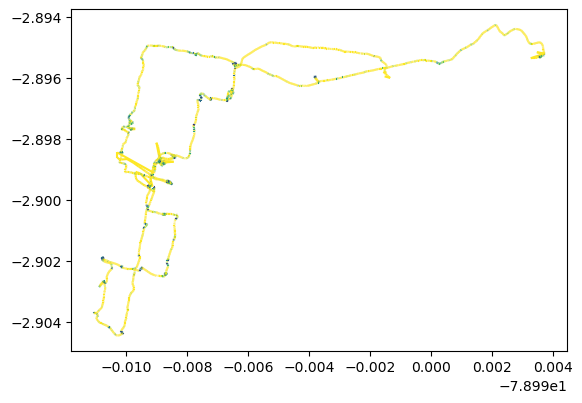

In [8]:
traj.plot(column='speed', vmax=1)


### Outlier cleaner

Outlier cleaning based in thresholds/quantile outliers, the method used is the IQR scoring method (https://en.wikipedia.org/wiki/Interquartile_range) 

This method detects the records that exists outside a quantile range that is picked based on the variance of the data and the alpha value picked to identify records that are considered noise/error, the larger the alpha, the wider the range of acceptable values

#### Max speed values after cleaning 

In [9]:
speed = pd.DataFrame(cleaned.df).sort_values(by='speed', ascending=False)
speed_km_h = speed['speed']*3600/1000
speed_km_h.head(20)

time
2023-04-28 21:20:36    5.499382
2023-04-28 18:36:56    5.499380
2023-04-28 20:48:40    5.499379
2023-04-28 18:31:25    5.499378
2023-04-28 21:12:31    5.499377
2023-04-28 18:38:23    5.499377
2023-04-28 21:00:49    5.499376
2023-04-28 18:45:25    5.499372
2023-04-28 20:03:53    5.499363
2023-04-28 20:17:51    5.499360
2023-04-28 18:35:47    5.499284
2023-04-28 18:35:43    5.499284
2023-04-28 18:34:35    5.499283
2023-04-28 18:33:32    5.499283
2023-04-28 20:50:03    5.499283
2023-04-28 18:32:18    5.499282
2023-04-28 20:53:36    5.499282
2023-04-28 21:02:10    5.499279
2023-04-28 20:03:45    5.499267
2023-04-28 18:58:37    5.499267
Name: speed, dtype: float64

### Smoother - KalmanSmootherCV

This smoother operates on the assumption of a nearly-constant velocity (CV) model. The process_noise_std and measurement_noise_std parameters can be used to tune the smoother:

process_noise_std governs the uncertainty associated with the adherence of the new (smooth) trajectories to the CV model assumption; higher values relax the assumption, therefore leading to less-smooth trajectories, and vice-versa.
measurement_noise_std controls the assumed error in the original trajectories; higher values dictate that the original trajectories are expected to be noisier (and therefore, less reliable), thus leading to smoother trajectories, and vice-versa.

### Compare

In [10]:
hvplot_defaults = {'tiles':'CartoLight', 'frame_height':320, 'frame_width':320, 'cmap':'Viridis', 'colorbar':True}
kwargs = {**hvplot_defaults, 'line_width':4}


In [11]:
smoothed = mpd.KalmanSmootherCV(cleaned).smooth(process_noise_std=0.1, measurement_noise_std=10)
    
(traj.hvplot(title='Original Trajectory', **kwargs) + 
 cleaned.hvplot(title='Cleaned Trajectory', **kwargs) + 
 smoothed.hvplot(title='Cleaned & Smoothed Trajectory', **kwargs))

:Layout
   .Overlay.I   :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Path.I   :Path   [Longitude,Latitude]
      .Points.I :Points   [Longitude,Latitude]   (triangle_angle)
   .Overlay.II  :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Path.I   :Path   [Longitude,Latitude]
      .Points.I :Points   [Longitude,Latitude]   (triangle_angle)
   .Overlay.III :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Path.I   :Path   [Longitude,Latitude]
      .Points.I :Points   [Longitude,Latitude]   (triangle_angle)

In [12]:
speed = pd.DataFrame(smoothed.df).sort_values(by='speed', ascending=False)
speed_km_h = speed['speed']*3600/1000
speed_km_h.head(20)

time
2023-04-28 21:20:36    5.499382
2023-04-28 18:36:56    5.499380
2023-04-28 20:48:40    5.499379
2023-04-28 18:31:25    5.499378
2023-04-28 21:12:31    5.499377
2023-04-28 18:38:23    5.499377
2023-04-28 21:00:49    5.499376
2023-04-28 18:45:25    5.499372
2023-04-28 20:03:53    5.499363
2023-04-28 20:17:51    5.499360
2023-04-28 18:35:47    5.499284
2023-04-28 18:35:43    5.499284
2023-04-28 18:34:35    5.499283
2023-04-28 18:33:32    5.499283
2023-04-28 20:50:03    5.499283
2023-04-28 18:32:18    5.499282
2023-04-28 20:53:36    5.499282
2023-04-28 21:02:10    5.499279
2023-04-28 20:03:45    5.499267
2023-04-28 18:58:37    5.499267
Name: speed, dtype: float64

<Axes: >

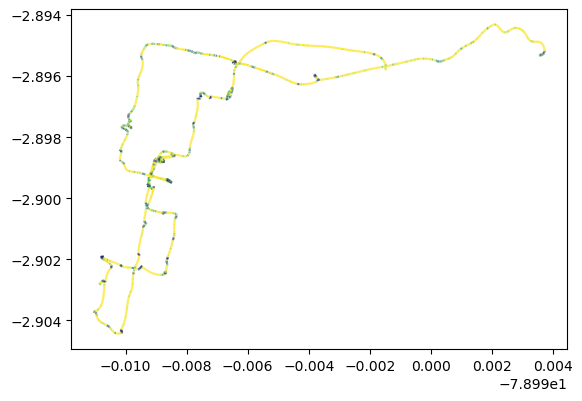

In [13]:
smoothed.plot(column='speed', vmax=1)

In [14]:
import dagstermill as __dm_dagstermill
__dm_dagstermill._teardown()
